<a href="https://colab.research.google.com/github/Alex1-ai/Dog-Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multil-class Dog Breed Classfication

This notebook builds an end-to-end multi-class image classifier using TensorFLow 2.0 and TensorFLow Hub


## 1. Problem
  Identifying the breed of a dog given an image of a dog.

  When I'm sitting at the cafe and I take a  photo of a dog. I want to know what breed of dog it is.

## 2. Data
 The data w'ere using is from kaggle's dog breed identification competition.

 https://www.kaggle.com/competition/dog-breed-identification/data


## 3. Evaluation
 The evaluation is a file with prediction probability of each dog breed of each test image

 https://www.kaggle.com/c/dog-breed-identification-evaluation


## 4. Features

Some information about the data:
* We're dealing with images(unstructured data) so it probably best we use deep learning/transfer learning

* There re 120 breeds of dogs (this time means there are 120 different classes).

* There are around 10,000+ images in the training set
* THere are around 10,000_ images in the test set



### Get our workspac ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import Tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version:", hub.__version__)


# checking if there is GPU availability
print("GPU", "available (YESSSS!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "Not available ")


TF version:  2.12.0
TF Hub version: 0.13.0
GPU available (YESSSS!!!!!!!!)


In [ ]:
import pandas as pd

In [ ]:
import numpy as np

## THis is a colab notebook

In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

## Getting our data into google colab and changing the images or data into Tensors

With all machine learning models our data has to be in numerical format that what we will doing first . So TUrning our images into tensors numerical data sets

* Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels or our data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

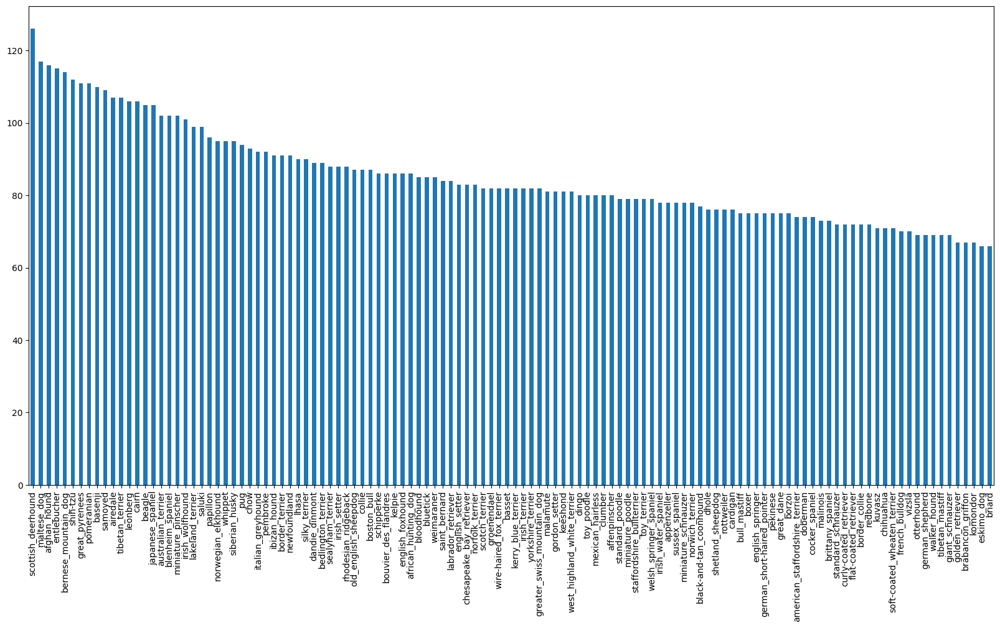

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

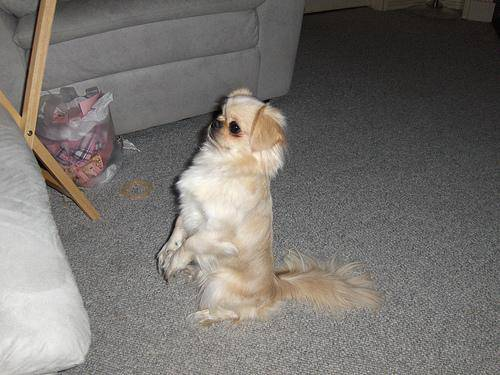

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

## Getting images and their labels


Let's get a list of all of our image file pathnamess.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames =  [fname for fname in labels_csv["id"]]

# check what it returns
filenames

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

# check the first 10


filenames[:10]


['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amout of files, check the target directory")

Filenames match actual amount of files!!! Proceed.


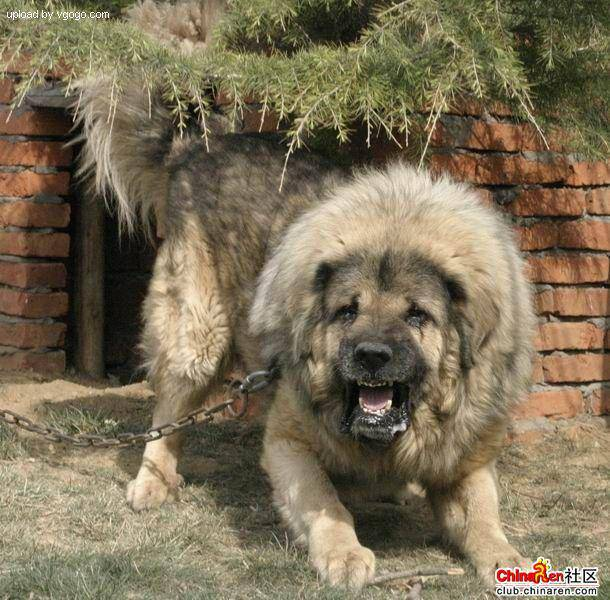

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we'e now got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matchesnumber of filenames")
else:
  print("Number of labels doe snot match number of filenames, check the directory")


Number of labels matchesnumber of filenames


In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)


120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels ]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # original label
print(boolean_labels[0].argmax()) # index where labels occurs in boolean
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own validations et
since the dataset from kaggle doesn't come with a validation set . creat ee our own validation

In [ ]:
# setup X & y variable
X = filenames
y = boolean_labels

We're going to start off experimenting wih  -1000 images and increase as needed

In [ ]:
# Set number of images to use for experimetning
NUM_IMAGES = 1000 #@param {type:"slider", max:1000, min:1}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split


# SPlit them into training and validation of total size NUm-images
X_train , X_val ,y_train,y_val = train_test_split(
    X[:NUM_IMAGES],
    y[:NUM_IMAGES],
    test_size=0.2,
    random_state=42
)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprosing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few thins:

1. Take an image filepath as input
2. use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified image

Before we do, let's see what importing an image looks like.

In [ ]:
# convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

## Now we've seen what an image looks like as a Tensor,let's make a function to preprocess them.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size =IMG_SIZE):
  """
    Takes an image file path and turns the image into a Tensor.
  """
  # read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 olour channels(red, green , blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the  batch if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this (image, lable)


In [ ]:
## TUrning our data into batches
def get_image_label(image_path, label):
  """
   Take an image file path name and the associated label, processes the image and return a type of image,lable

  """

  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above

(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of tensors  in the form : `(image, label)` , let's make a function to turn all of our data (`X`, `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """

  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it'ss validation data
  Also accepts test data as input (no labels)
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data  = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # IF the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((
                                            tf.constant(X),# filepath
                                            tf.constant(y) # labels
                                               ))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # TUrn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image )
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of oru data batches
val_data.element_spec, train_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visualizing the data

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
   Displays a plot of 25 images their labels from a data batch.

  """
  # Setup  the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.79158795, 0.69470274, 0.5725571 ],
          [0.66108286, 0.5630437 , 0.44147506],
          [0.6814689 , 0.5838201 , 0.4665775 ],
          ...,
          [0.3421079 , 0.38790452, 0.37518403],
          [0.34166878, 0.4046615 , 0.41781595],
          [0.35425434, 0.4248426 , 0.44052887]],
 
         [[0.77824485, 0.6906573 , 0.5684038 ],
          [0.7434966 , 0.6510771 , 0.5295085 ],
          [0.72953945, 0.63729864, 0.5167524 ],
          ...,
          [0.26686263, 0.3405777 , 0.35359243],
          [0.3018096 , 0.3743547 , 0.39608726],
          [0.31948543, 0.3872638 , 0.4113797 ]],
 
         [[0.6715214 , 0.5985347 , 0.48241076],
          [0.66353965, 0.58519226, 0.465096  ],
          [0.69085175, 0.6020564 , 0.48017266],
          ...,
          [0.2493784 , 0.35844725, 0.3870451 ],
          [0.28244936, 0.35909492, 0.38795346],
          [0.306609  , 0.37327567, 0.40437332]],
 
         ...,
 
         [[0.6199191 , 0.53019226, 0.36940795],
          [0.75821

In [ ]:
len(train_images), len(train_labels)

(32, 32)

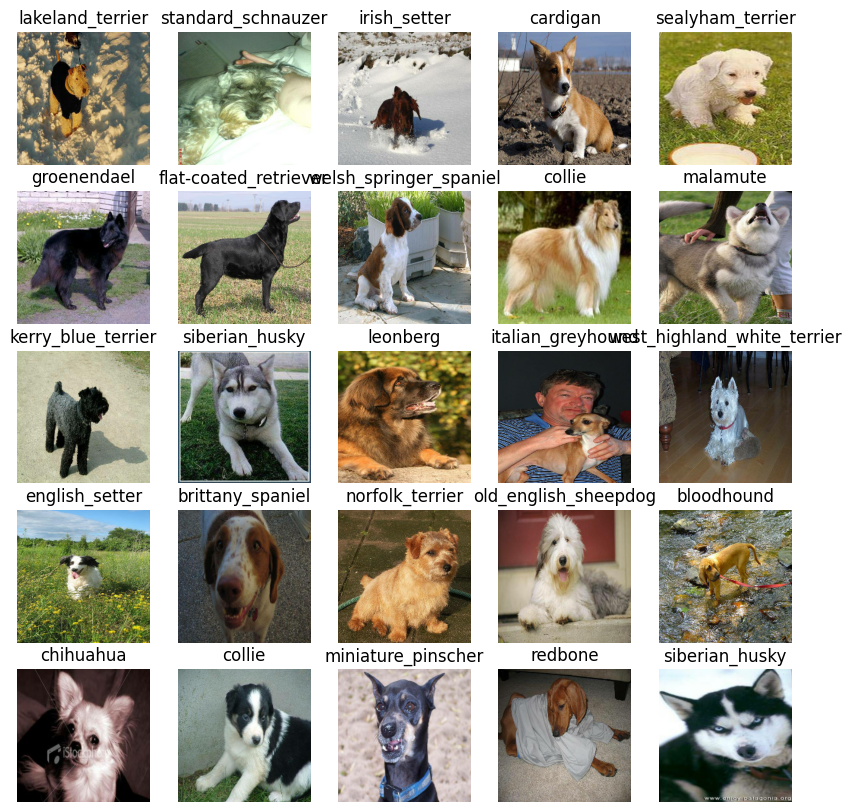

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

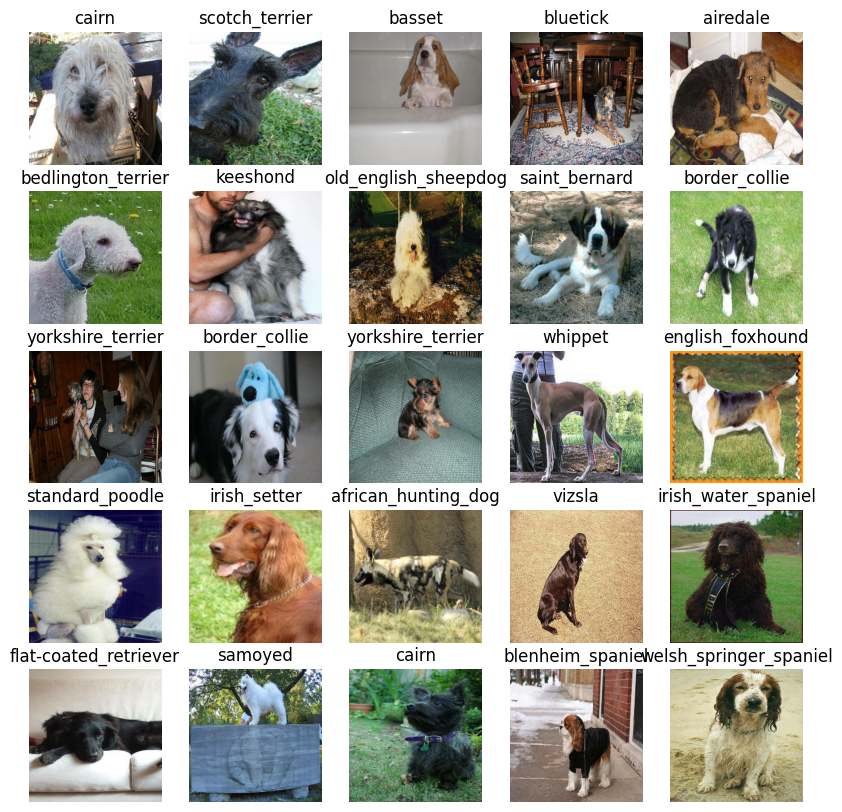

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

## Building a model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TnsorFlow Hub. https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model

INPUT_SHAPE = [ None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channel

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs, outputs  and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, oiut shape and the model we've chosen as parameters .
* Defines the layers in a keras model in sequantial fashion (do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape that it will be geeting)
* Returns the model

All of this steps can be found here: https://www.tensorflow.org/guide/keras/overview


In [ ]:
# create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,
                 output_shape=OUTPUT_SHAPE,
                 model_url=MODEL_URL
                 ):
     print("Building model with: ", MODEL_URL)

     # Setup the model layers
     model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                              activation="softmax") # Layer 2 (ouput layer)


     ])
     # Compile the model
     model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.Adam(),
        metrics = ["accuracy"]
     )

     # Build the model
     model.build(INPUT_SHAPE)
     return model




In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callback are helper functions a model can use during training to do such things sae its progress, check its progress or stop training if a model stops improving

We'll create two callbacks one for Tensorboard which helps to track our models progress and another for early stopping which prevents our model from training for too long

### TensorBoard Callback


To set a tensorboard callback, we need to do 3 things:
1. load the Tensorboard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training)

In [ ]:
#Load TensorBoard noteook extension
%load_ext tensorboard

In [ ]:
import datetime



# Create a function to build a TensorBoard callbakc
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make tit so the logs are tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                        )
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stop improving

In [ ]:
# create earlys topping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model (on subset of data)


Our firrst model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU

print("GPU", "avaialble (YESS!!!!!!!)"if tf.config.list_physical_devices("GPU") else "Not available")

GPU avaialble (YESS!!!!!!!)


Let's create a function which trains a model.


* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the trainning data, validation data , number of epchs to train for (`NUM_EPOCHS`)
and the callback we would like to use
* Return the model


In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns the trained version.

  """# Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the calbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 123s 3s/step - loss: 4.5543 - accuracy: 0.0925 - val_loss: 3.2652 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.6281 - accuracy: 0.6900 - val_loss: 2.0604 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 4s 149ms/step - loss: 0.5680 - accuracy: 0.9388 - val_loss: 1.6280 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 3s 120ms/step - loss: 0.2552 - accuracy: 0.9850 - val_loss: 1.4687 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 150ms/step - loss: 0.1453 - accuracy: 0.9975 - val_loss: 1.3845 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 151ms/step - loss: 0.0999 - accuracy: 1.0000 - val_loss: 1.3546 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing . it means that our model is larning

## checking the Tensorboard logs

THe TEnsorBoard magic ffunction(`tensorboard`) will access the logs directory we created earlier and visualize it content

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the Validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 93ms/step


array([[1.0412588e-03, 6.7317036e-05, 8.8814774e-04, ..., 5.7656929e-04,
        5.8105202e-06, 1.9902759e-03],
       [1.7233465e-03, 2.7504822e-04, 2.5217712e-02, ..., 3.2455151e-04,
        3.0629587e-04, 1.6666799e-04],
       [9.3847913e-05, 1.0486139e-04, 3.7002723e-05, ..., 7.6382123e-05,
        4.7636458e-06, 4.4133185e-04],
       ...,
       [1.4079670e-05, 1.0536345e-04, 5.0567629e-05, ..., 1.0197300e-05,
        1.5120464e-04, 3.2943197e-05],
       [1.5432060e-03, 3.1244577e-04, 1.4662841e-05, ..., 3.1958654e-04,
        6.3784144e-05, 9.6266735e-03],
       [5.5531919e-04, 5.0096209e-05, 1.2516334e-03, ..., 4.7451449e-03,
        6.5400021e-04, 6.6559063e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
np.sum(predictions[1])

0.9999999

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# FIrst prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.04125880e-03 6.73170362e-05 8.88147741e-04 3.58135730e-05
 1.77507936e-05 2.13456497e-05 5.92758693e-03 1.54883752e-03
 3.20910214e-04 8.48539130e-05 1.14282448e-04 3.25706962e-04
 3.41293868e-04 1.44072226e-04 9.94374743e-04 2.27864971e-03
 3.92555339e-05 1.70815155e-01 1.99606493e-05 2.22249819e-05
 9.28084657e-04 2.27828023e-05 1.91443942e-05 3.26662138e-03
 2.48345488e-04 1.47902785e-04 2.13391811e-01 1.42616809e-05
 2.11946419e-04 3.43993655e-04 4.81120485e-04 2.54896632e-03
 1.18413311e-03 1.24910666e-05 1.44602804e-04 1.12886265e-01
 3.61213370e-06 1.01321517e-03 5.29597783e-05 7.97686880e-05
 1.09971571e-03 1.55908001e-05 2.29857851e-05 2.29971891e-04
 1.67212875e-05 6.28407506e-05 2.18743662e-05 9.25662694e-04
 1.08717308e-04 4.32192755e-05 4.13762718e-05 1.46914652e-04
 3.61328508e-04 1.73136475e-04 3.72180002e-05 7.55021974e-05
 2.16702829e-04 3.55987088e-03 2.74127378e-04 5.38693108e-02
 2.60236528e-04 4.67620339e-05 3.87242791e-04 4.28998756e-05
 1.57431932e-04 2.310992

In [ ]:
unique_breeds[26]

'cairn'

Having the above functionality is great but we want to be able to do it at scale.

And it would be  even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confident  level


In [ ]:
# Turn prediction probability into there unique lable

def get_pred_label(prediction_probabilities):
  """

  Turn an array of prediction probabilities into a label.

  """
  return unique_breeds[np.argmax(prediction_probabilities)]



# Get a prodicted label based on an array of preddiction probabilites
pred_label = get_pred_label(predictions[42])
pred_label

'walker_hound'

Now since our validation data is stil in a batch dataset,
we'll have to unbatchify it to make predictions on the
validation images and then compare tose predictions to the validation labels(truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate
  arrays of images and labels

  """
  images = []
  labels  = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels


# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get :
* Prediction labels
* vlidation labels( turth labels)
* validation images

Let's make some funtion to make these all a bit more vsisualie.

We'll create a function which:
* Takes an array of prediction probabilites, an array of truth labels and array of images and integers
* convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target label on the same plot

In [ ]:
images_ = []
labels_ = []

for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n =1):
  """

  view the prediction, ground truth and images for sample n

  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the colour of the title depending on if the prediction and truth lable
  if pred_label == true_label:
    color= "green"
  else:
    color="red"

  # Change plot title to be predicted probability of predicction
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)* 100, true_label), color=color)

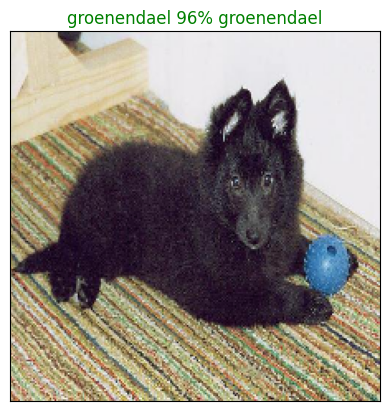

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, n=77)

Now we've got one functio to visualize our models top prediction, let's make another to view our models top 10 prediction

This function will:
* Take an input of prediction probabilities array and ground truth array and integer
* Find the prediction use get_pred_lable()
   * Prediction probabilites indexes
   * prediction probabilites values
   * prediction labels

* Plot the top 10 prediction probabiities values and labels, coloring the true and greeen

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """

   Plus the top highest prediction confidences along the truth label for sample
   """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)


  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")

  # change color of true lable
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label )].set_color("green")
  else:
    pass

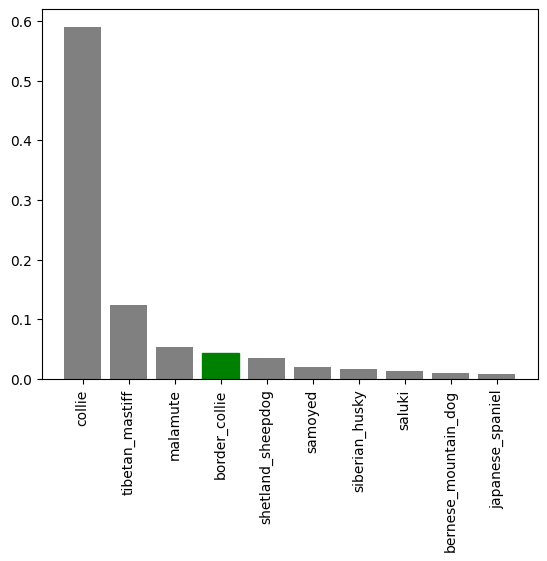

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels,n=9)

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  17,  35,  70,  77,  59,  73, 109,  83, 103])

Now we've got some function to help us visualize our predictions and evaluate our model let checkout a few

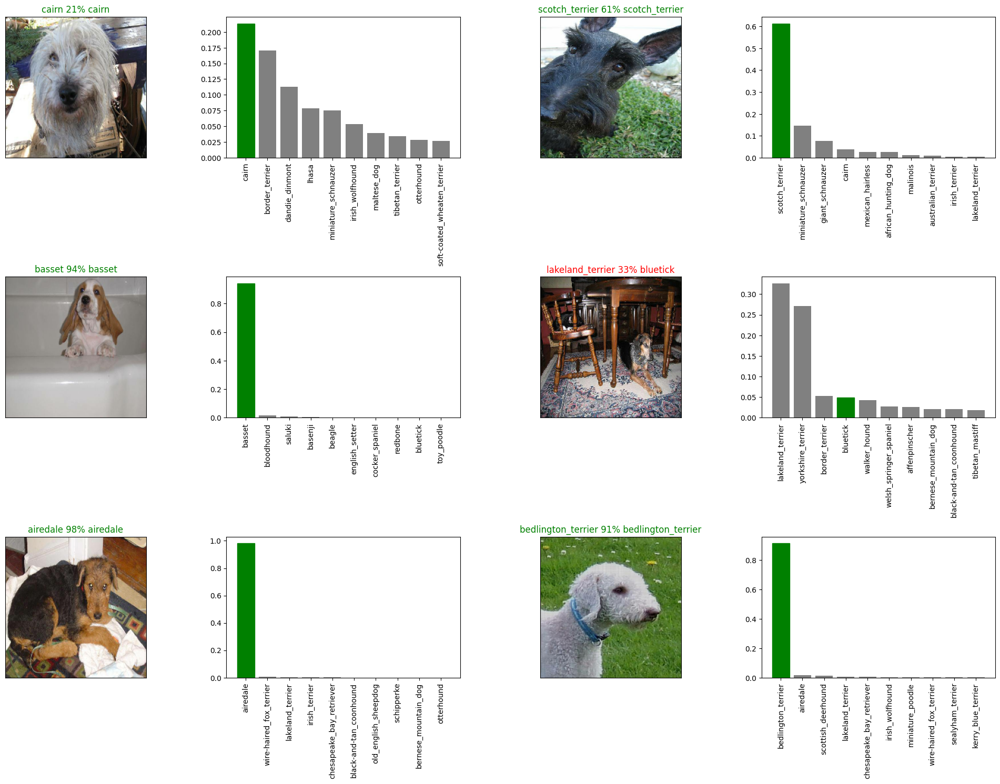

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows* num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.5)
plt.show()

Challenge: How would you create a confusion matrix with out moels predictions and true lable

Save and  reloading a model


In [ ]:
# create a function to save a model
def save_model(model, suffix=None):
  """

  Saves a given model in a models directory and appends a suffix (string)

  """
  # create a model directory pathname with curent time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-$H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# create a function to load a model
def load_model(model_path):
   """
           Loads a saved model form a specified path

   """
   print(f"Loading saved model {model_path}")
   model = tf.keras.models.load_model(model_path,
                                      custom_objects={"KerasLayer":hub.KerasLayer})
   return model



Now we've got functions to save and load a trained model, let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

saving model to : drive/My Drive/Dog Vision/models/20230711-$H511689069078-1000-images-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230711-$H511689069078-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/My Drive/Dog Vision/models/20230710-$H411688992886-1000-images-mobilenetv2-Adam.h5')

Loading saved model drive/My Drive/Dog Vision/models/20230710-$H411688992886-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.2569 - accuracy: 0.6650


[1.256943702697754, 0.6650000214576721]

In [ ]:
# evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 93ms/step - loss: 1.2930 - accuracy: 0.6950


[1.292974829673767, 0.6949999928474426]

## Trianing a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X_train


['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/My Drive/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/My Drive/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/My Drive/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/My Drive/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/My Drive/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg',
 'drive/My Drive/Dog Vision/train/019ff93e03802e661577b5869e099dcb.jpg',
 'drive/My Drive/Dog Vision/train/035f28d8ad34afaf7c8d276d6674bf8f.jpg',
 'drive/My Drive/Dog Vision/train/16ac25747d1a51db033d6461156ddb0b.jpg',
 'drive/My Drive/Dog Vision/train/14597c96d5c222eeb

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when trianing on all the data, so we can't monitor validation accuracy
full_model_early_stopping  = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**Note:** Running the cell below will take a little while maybe upto 30 minutes for the firest epoch because the GPU we're using in the runtime has to load all the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 110ms/step - loss: 1.3370 - accuracy: 0.6703
Epoch 2/100
320/320 [==============================] - 34s 105ms/step - loss: 0.3973 - accuracy: 0.8806
Epoch 3/100
320/320 [==============================] - 33s 103ms/step - loss: 0.2394 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1537 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1050 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0767 - accuracy: 0.9880
Epoch 7/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0566 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0451 - accuracy: 0.9949
Epoch 9/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0369 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 33s 103m

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

saving model to : drive/My Drive/Dog Vision/models/20230711-$H021689069725-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20230711-$H021689069725-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20230710-$H221688995343-full-image-set-mobilenetv2-Adam.h5')

Loading saved model drive/My Drive/Dog Vision/models/20230710-$H221688995343-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

## Making predictions on the test dataset


Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll;
* Get the test image filenames
* convert the filenames into test data batches using `create_date_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.


In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 'drive/My Drive/Dog Vision/test/e5a78d4d53fc5957cc9dedd318139d3d.jpg',
 'drive/My Drive/Dog Vision/test/e6c9d8058cbc9b1665aecac1ae179288.jpg',
 'drive/My Drive/Dog Vision/test/e423b91111a1c5b52cc1026086f263f2.jpg',
 'drive/My Drive/Dog Vision/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 'drive/My Drive/Dog Vision/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 'drive/My Drive/Dog Vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 'drive/My Drive/Dog Vision/test/dd1101676d8c7fa8522dd5ebd1129d17.jpg',
 'drive/My Drive/Dog Vision/test/ddbb53bb7ea7060847a0bd4554877e80.jpg',
 'drive/My Drive/Dog Vision/test/e0c767bc2bc03b909526f1861c712b13.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data  batch
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling `predict()` on our full model and passing it he test data batch will take along time to run (about an hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictio0ns = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1833s 6s/step


In [ ]:
# save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictio0ns, delimiter=" ")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=" ")

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models predictions probability outputs in a DataFrame with an ID and a column for each different dog breed.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in these format, we'll:
* create a pandas DataFrame with an ID coloumn as well as a column for each dog breed

* Add data to the ID column by extracting the test image ID's from their filepath

* Add data (the predictio0n probabilities) to each of the dog breed columns.

* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids= [os.path.splitext(path)[0] for path in os.listdir(test_path)]

preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e24b2d063b3ad699d5eba7a01e4ae956,5.200186e-09,8.674572e-07,1.886178e-07,6.937893e-08,5.386537e-08,7.049011e-10,4.260687e-06,1.546685e-10,5.575078e-10,...,7.846147e-11,1.701554e-11,4.757636e-09,9.930922e-08,3.198285e-08,1.409264e-11,8.192400e-11,1.686080e-07,2.515280e-06,3.300903e-09
1,e5a78d4d53fc5957cc9dedd318139d3d,2.892759e-10,6.260444e-08,3.647314e-11,1.545780e-06,9.618174e-08,2.290253e-07,2.860265e-08,2.281025e-08,7.589886e-05,...,7.146239e-09,2.429494e-07,1.834505e-03,2.019612e-04,1.027111e-08,7.069489e-10,1.982734e-11,1.030555e-08,1.626494e-05,2.534270e-10
2,e6c9d8058cbc9b1665aecac1ae179288,3.323429e-10,4.211220e-10,3.084491e-11,2.954911e-13,4.853491e-08,9.377798e-08,1.009078e-08,3.542885e-09,3.267842e-15,...,1.851684e-09,1.216774e-12,1.953424e-12,2.851402e-09,1.133060e-11,4.561825e-12,2.455877e-10,8.571277e-07,5.363375e-09,1.019987e-12
3,e423b91111a1c5b52cc1026086f263f2,1.245062e-12,3.850314e-12,1.713124e-10,1.038830e-11,4.296055e-09,2.205983e-11,1.040287e-14,1.939021e-11,7.617170e-10,...,1.333869e-10,7.991488e-13,5.568386e-07,3.044113e-08,1.711437e-08,2.831633e-13,6.889754e-12,2.435616e-06,2.308359e-12,8.235220e-12
4,e1c6c50bbaee219e7faf29e9c1c343ca,9.852438e-01,4.672634e-06,2.581633e-09,1.461357e-12,1.659376e-14,2.806867e-13,1.520948e-08,1.846734e-11,7.792755e-10,...,1.537305e-07,8.209892e-13,5.081047e-10,3.775076e-11,2.984430e-10,2.314193e-12,1.094813e-12,3.715468e-13,4.084385e-11,1.371797e-04


In [ ]:
# save our predictions dataframe to CSV for submission to kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_prediction_submission_1_mobilenetv2.csv", index=False)

## Making predictions on custom images


TO make prediction on customer images, we'll;
* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches().And since our custom images won't have labels, we set the test_data parameter to True
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabiities to predictions labels.
* Compare the predicted labels to the customer images

In [ ]:
# Get custom image filepathws
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths= [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/dog2.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog1.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/karsten-winegeart-BJaqPaH6AGQ-unsplash.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 786ms/step


In [ ]:
custom_preds

array([[3.57689309e-08, 3.27817816e-06, 2.73449192e-08, 6.62242622e-11,
        6.93913489e-06, 2.91776470e-09, 4.76332247e-07, 1.44491707e-08,
        3.64843933e-10, 3.84298104e-09, 1.81983728e-09, 7.70508905e-06,
        1.00475532e-04, 8.76028416e-10, 9.43004750e-07, 1.59717644e-08,
        6.96144029e-02, 4.24038166e-11, 8.79584695e-06, 2.56988346e-06,
        2.06859085e-09, 6.24056256e-08, 6.91981867e-08, 1.42104996e-04,
        9.89477030e-07, 1.09929781e-08, 4.05547063e-08, 1.28139106e-06,
        2.47150549e-08, 1.63491816e-08, 7.04260892e-05, 5.97955004e-05,
        5.33034772e-08, 2.56091425e-06, 7.70301956e-09, 2.90227632e-07,
        8.22271261e-07, 6.82743035e-08, 1.11925226e-06, 3.38616445e-07,
        6.02791062e-08, 9.08459938e-08, 3.02172026e-07, 1.24325804e-01,
        3.45677768e-06, 1.34793129e-06, 2.18683446e-04, 1.24996058e-09,
        5.79583226e-09, 2.58137043e-05, 1.03748823e-06, 4.32170300e-09,
        4.84111297e-05, 3.85003023e-06, 5.29114865e-02, 3.440966

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction lbels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['samoyed', 'border_collie', 'french_bulldog']

In [ ]:
# Get custom images (our unbatchifu() function won't work since there aren't labless.. maybe we could fix that later

custom_images = []

# Loop throught unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

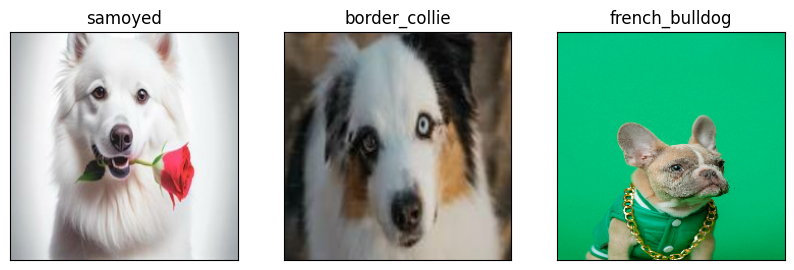

In [ ]:
plt.figure(figsize=(10,10))

for i , image in enumerate(custom_images[:3]):
  plt.subplot(1,  3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)